In [55]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import minimize
from astropy.io import fits
from scipy.signal import argrelextrema
from scipy.optimize import differential_evolution, curve_fit
from scipy.stats import linregress
from numpy import polyfit
from astropy.modeling import models, fitting
from scipy.fft import rfft, rfftfreq, irfft

import wget

In [46]:
#load in all the data and build the dictionaries
data = {}

#download the data 
#filename = '/home/donlon/Desktop/data/kepler_data/kepler_lc_wget_V2367_Cyg.txt' #V2367_Cyg
filename = '/home/donlon/Desktop/data/kepler_data/kepler_lc_wget_7106205.txt' #KIC 7106205


with open(filename) as f:
    for i, line in enumerate(f):
        fits_file = wget.download(line.lstrip('wget --no-verbose '))
    
        hdul = fits.open(fits_file)

        # Read in the "BJDREF" which is the time offset of the time array.
        bjdrefi = hdul[1].header['BJDREFI'] 
        bjdreff = hdul[1].header['BJDREFF']

        # Read in the columns of data.
        times = hdul[1].data['time'] 
        sap_fluxes = hdul[1].data['SAP_FLUX']
        pdcsap_fluxes = hdul[1].data['PDCSAP_FLUX']

        bjds = times + bjdrefi + bjdreff 

        sample_spacing = (bjds[-1] - bjds[0])/len(bjds)
        sample_rate = 1/sample_spacing

        data[i] = {
                   'bjds': bjds,
                   'sap_fluxes': sap_fluxes,
                   'pdcsap_fluxes': pdcsap_fluxes,
                   'sample_spacing': sample_spacing,
                   'sample_rate': sample_rate
                  }
    
print('data read in successfully')


100% [........................................................] 187200 / 187200data read in successfully


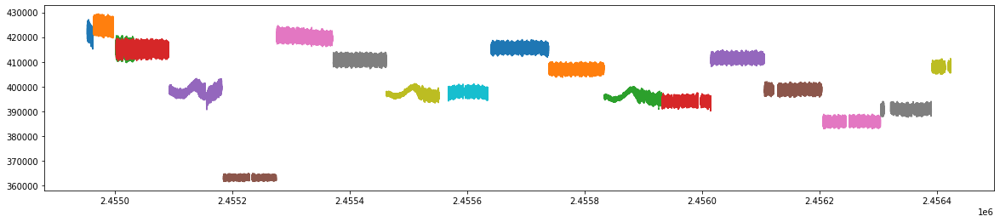

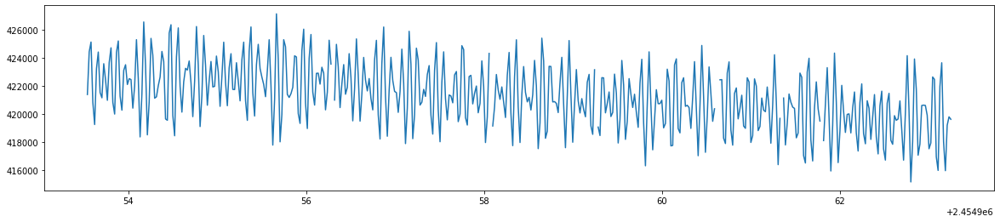

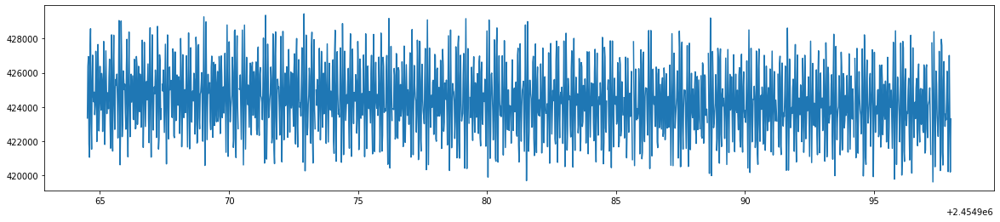

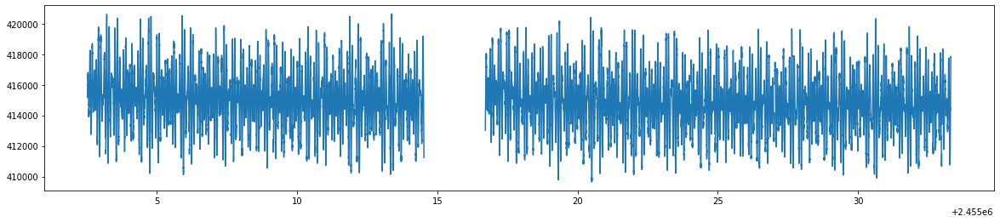

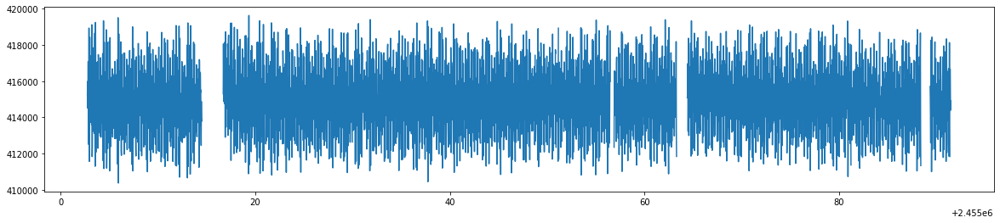

...

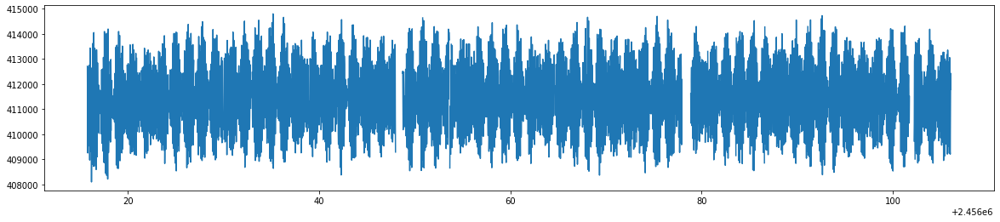

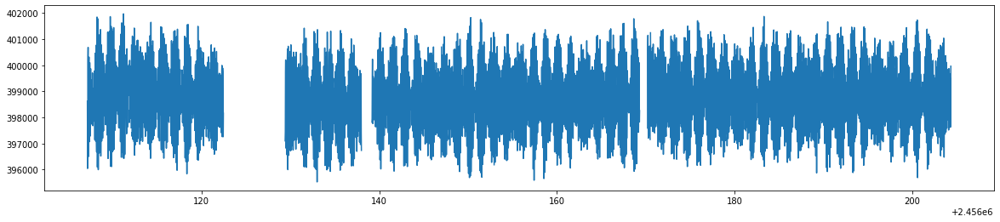

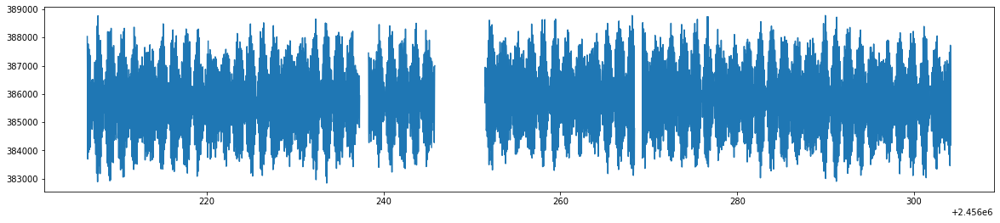

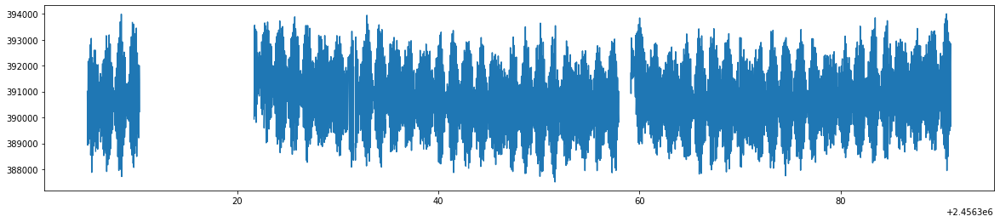

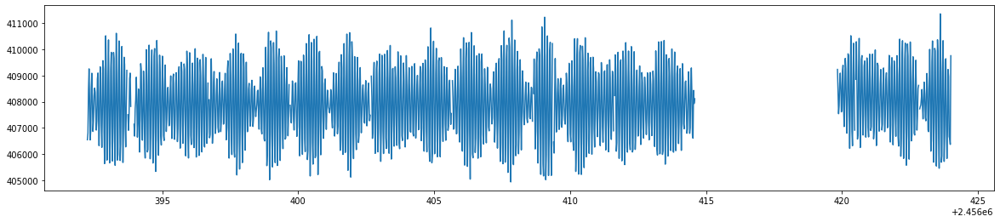

In [47]:
#make some plots of the data

#all the data
fig = plt.figure(figsize=(20, 4))
for key in data.keys():
    plt.plot(data[key]['bjds'], data[key]['pdcsap_fluxes'])
plt.show()

#each time slice
for key in data.keys():
    fig = plt.figure(figsize=(20, 4))
    plt.plot(data[key]['bjds'], data[key]['pdcsap_fluxes'])
    plt.show()

In [80]:
interp_pdcsap_fluxes = [(pdcsap_fluxes[i] if not(np.isnan(pdcsap_fluxes[i])) else (pdcsap_fluxes[i-1] + pdcsap_fluxes[i+1])/2 ) for i in range(len(pdcsap_fluxes))]

for j in range(100):
    interp_pdcsap_fluxes = [(interp_pdcsap_fluxes[i] if not(np.isnan(interp_pdcsap_fluxes[i])) else (interp_pdcsap_fluxes[i-j] + interp_pdcsap_fluxes[i+j])/2 ) for i in range(len(pdcsap_fluxes))]

scale of fft: 0.11659178180206554  inverse BJDs


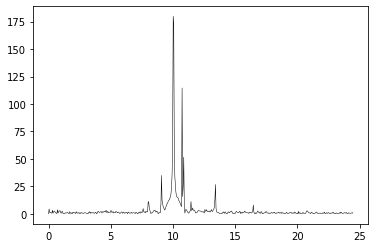

fund. freq.: 10.017310348802123 days^-1
period: 0.0998271956423493 days


In [87]:
#do a fft and find the fundamental frequency

#--------------------
#have to fix the fluxes first to actually get an fft
interp_pdcsap_fluxes = [(pdcsap_fluxes[i] if not(np.isnan(pdcsap_fluxes[i])) else (pdcsap_fluxes[i-1] + pdcsap_fluxes[i+1])/2 ) for i in range(len(pdcsap_fluxes))]

for j in range(100):
    interp_pdcsap_fluxes = [(interp_pdcsap_fluxes[i] if not(np.isnan(interp_pdcsap_fluxes[i])) else (interp_pdcsap_fluxes[i-j] + interp_pdcsap_fluxes[i+j])/2 ) for i in range(len(pdcsap_fluxes))]
    
i = 0
while not(np.isnan(interp_pdcsap_fluxes[i])) and i < len(interp_pdcsap_fluxes):
    i += 1
interp_pdcsap_fluxes = interp_pdcsap_fluxes[:i]
#-------------------
tmp = interp_pdcsap_fluxes - np.mean(interp_pdcsap_fluxes)
power_series = rfft(tmp / np.max(tmp))
mag_power_series = np.abs(power_series)
power_series_bins = rfftfreq(len(interp_pdcsap_fluxes), sample_spacing)

delta_f = sample_rate / len(usable_fluxes)
print('scale of fft:', delta_f, ' inverse BJDs')

plt.plot(power_series_bins, mag_power_series, c='k', lw=0.5)
plt.show()

ffreq = power_series_bins[np.argmax(mag_power_series)]
print('fund. freq.:', ffreq, 'days^-1')
print('period:', 1/ffreq, 'days')

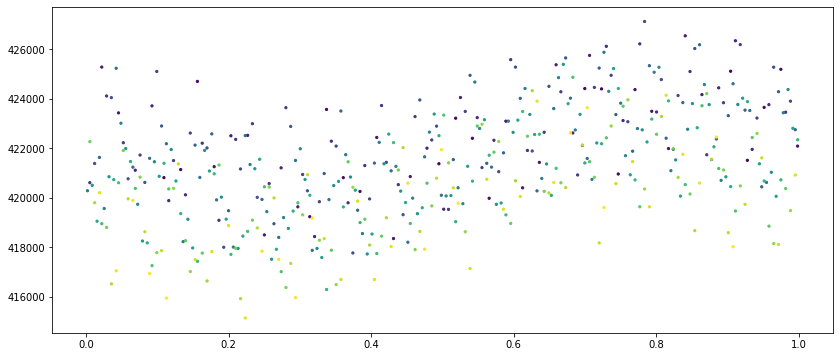

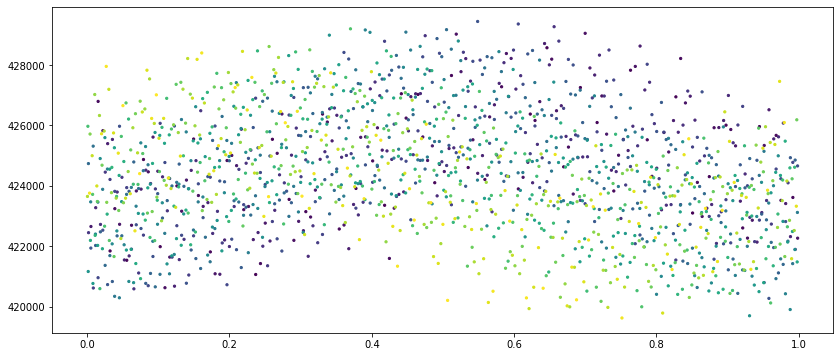

/tmp/ipykernel_5609/146163058.py:5: RuntimeWarning: invalid value encountered in remainder
  folded_bjds = (data[key]['bjds'] % period)/period
/tmp/ipykernel_5609/146163058.py:8: RuntimeWarning: invalid value encountered in floor_divide
  plt.scatter(folded_bjds, data[key]['pdcsap_fluxes'], s=5, c=(data[key]['bjds']//period))


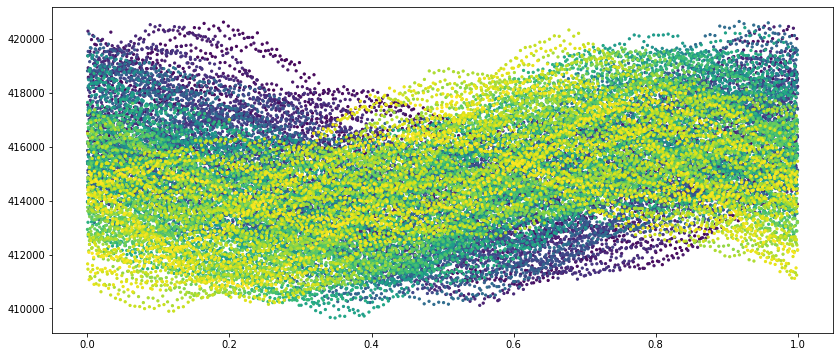

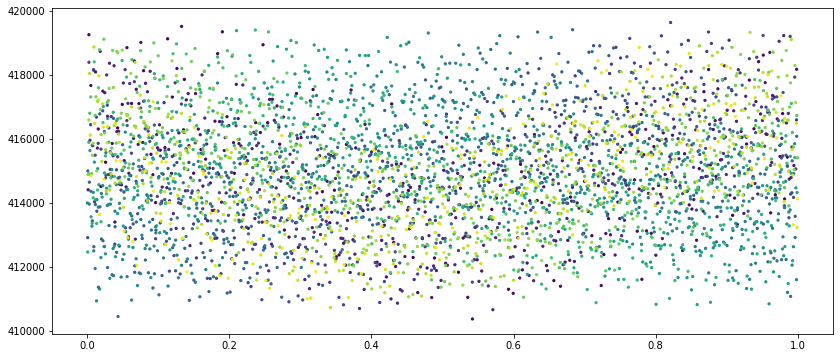

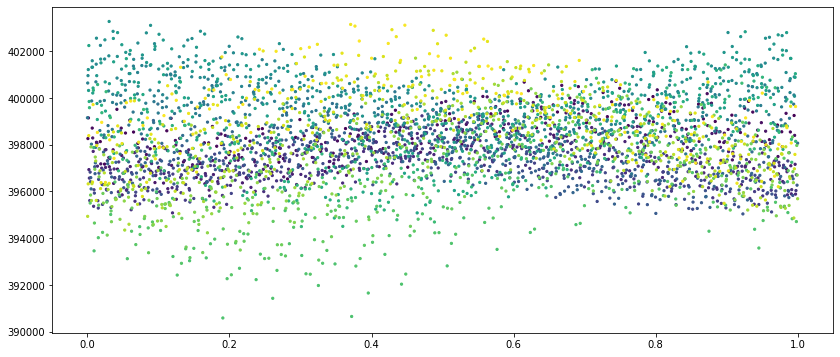

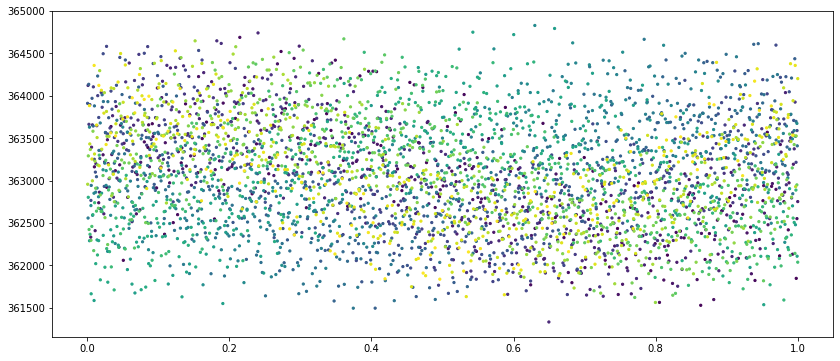

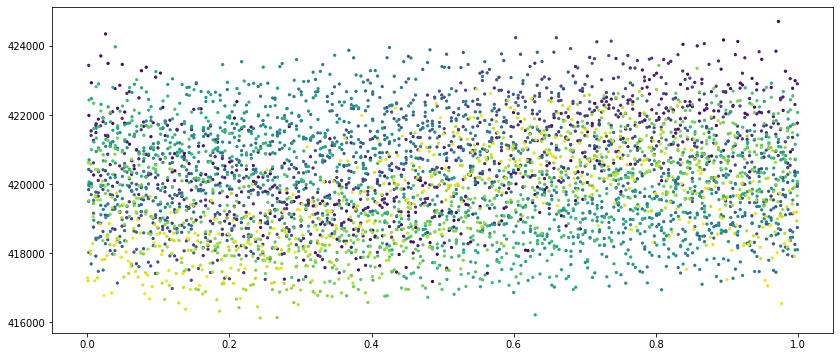

...

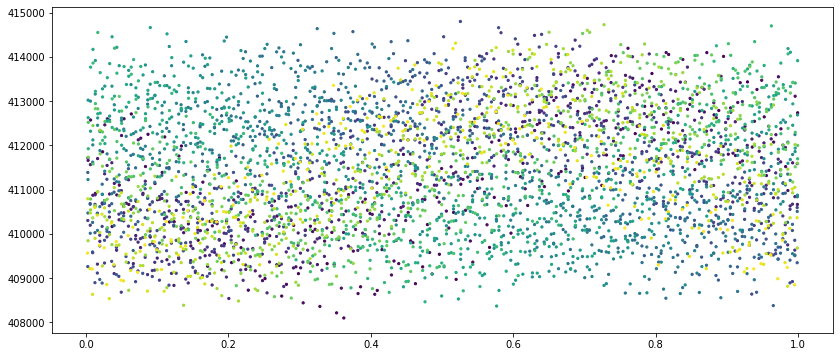

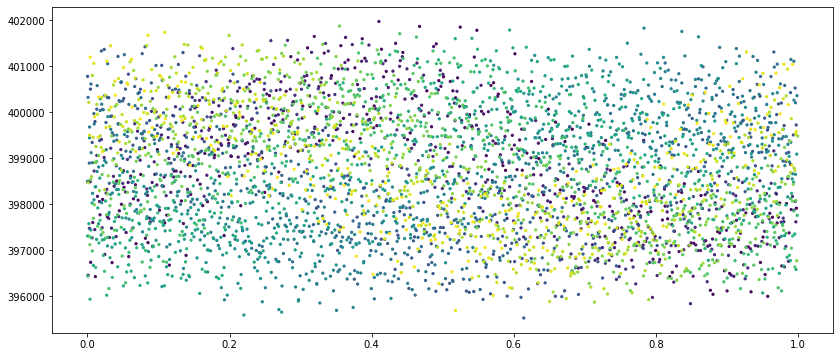

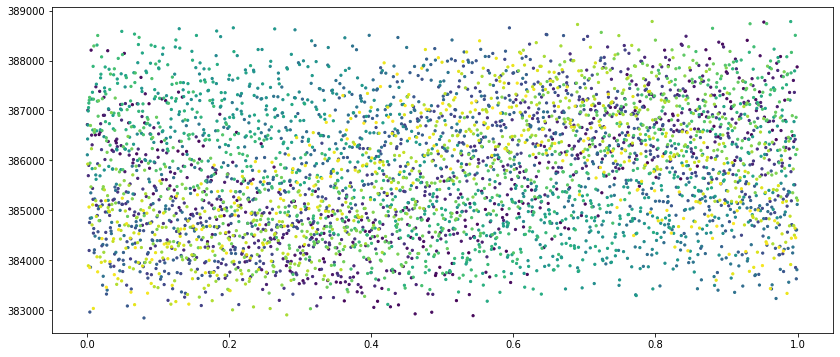

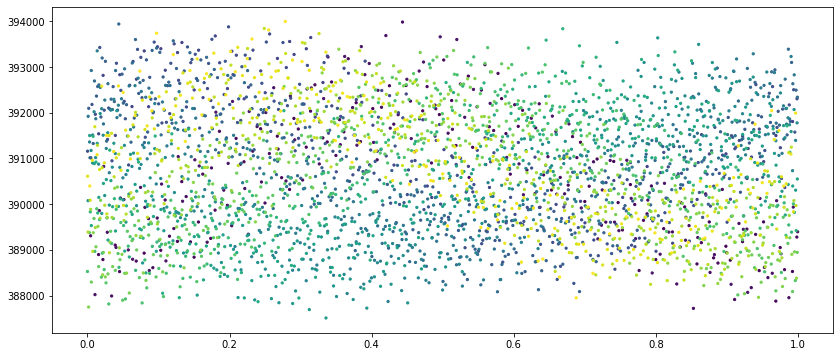

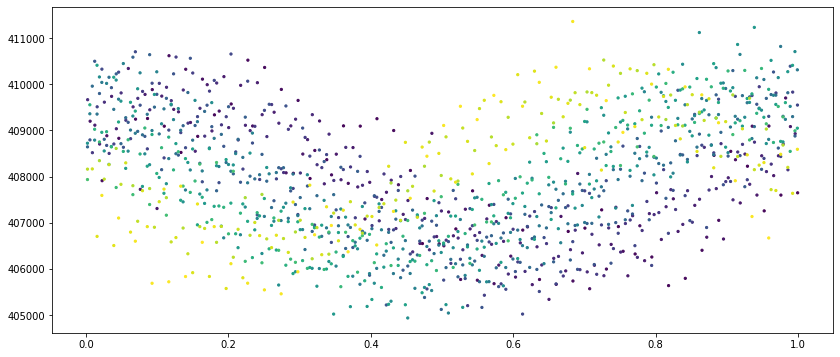

In [123]:
#plot folded data 
period = 1/ffreq #BJDs, technically a period guess

for key in data.keys():
    folded_bjds = (data[key]['bjds'] % period)/period

    fig = plt.figure(figsize=(14, 6))
    plt.scatter(folded_bjds, data[key]['pdcsap_fluxes'], s=5, c=(data[key]['bjds']//period))
    plt.show()

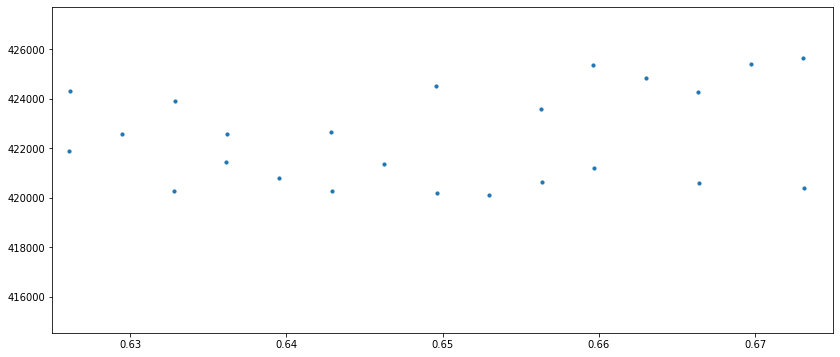

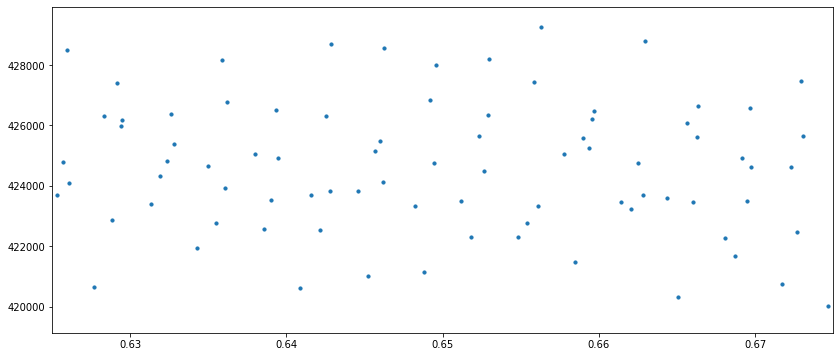

/tmp/ipykernel_5609/1671066977.py:2: RuntimeWarning: invalid value encountered in remainder
  folded_bjds = (data[key]['bjds'] % period)/period


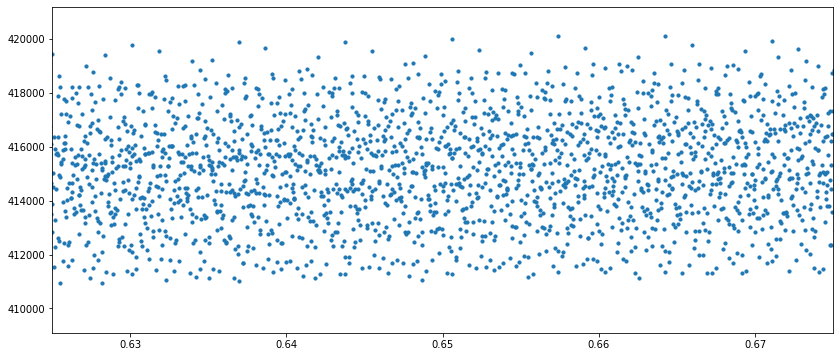

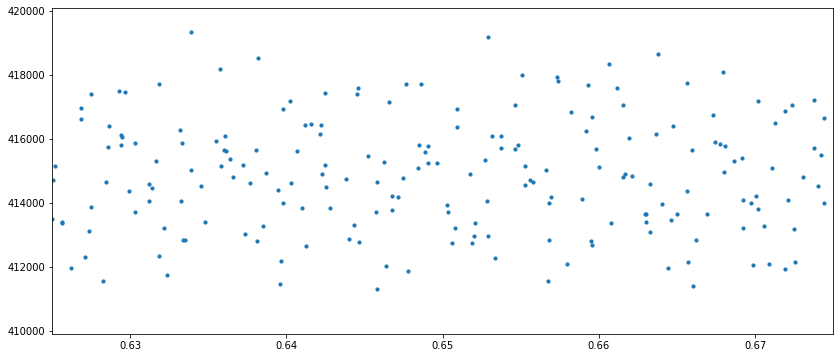

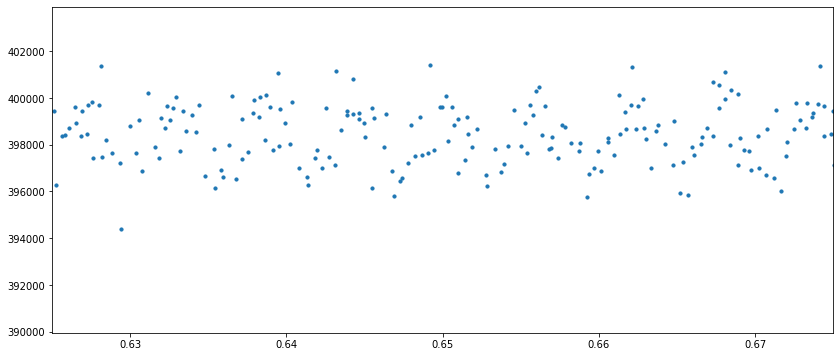

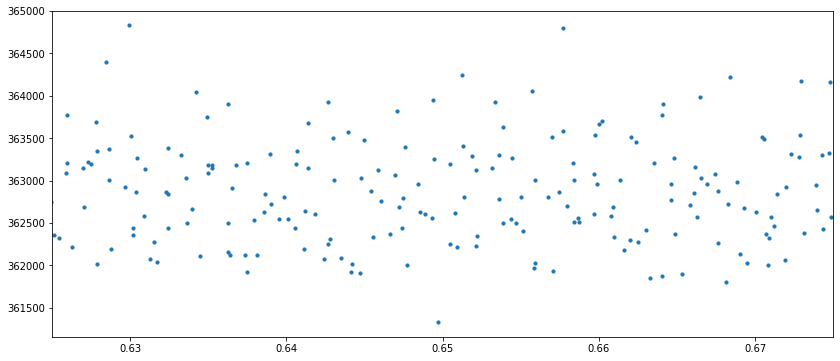

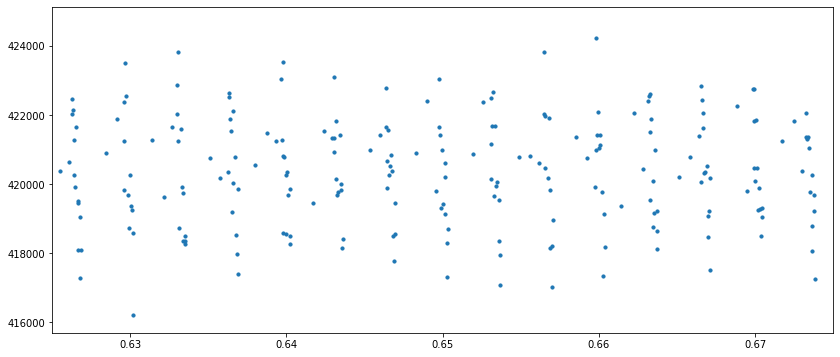

...

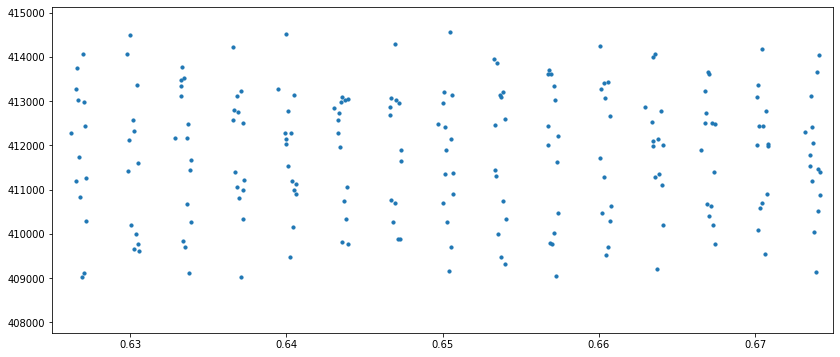

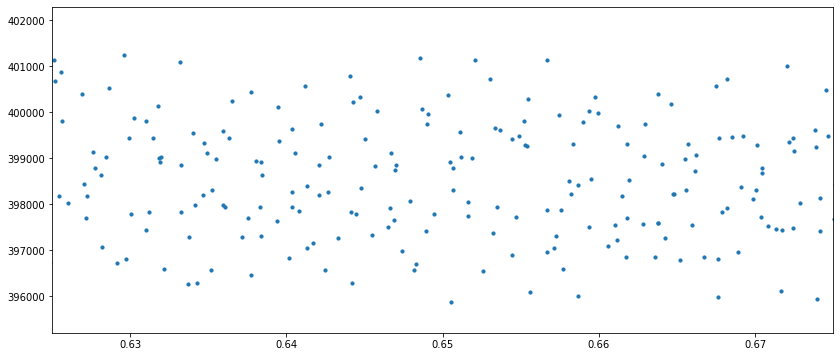

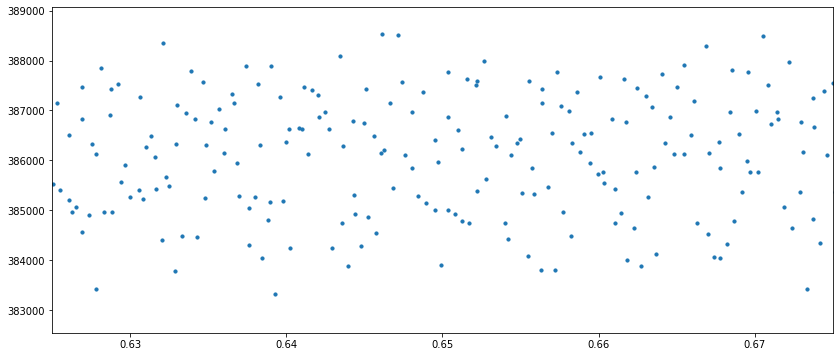

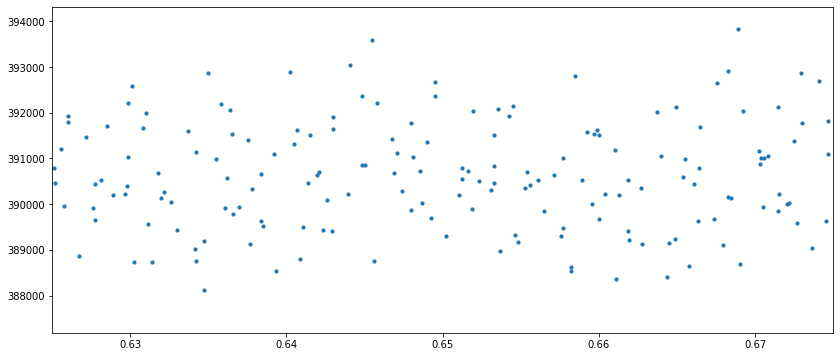

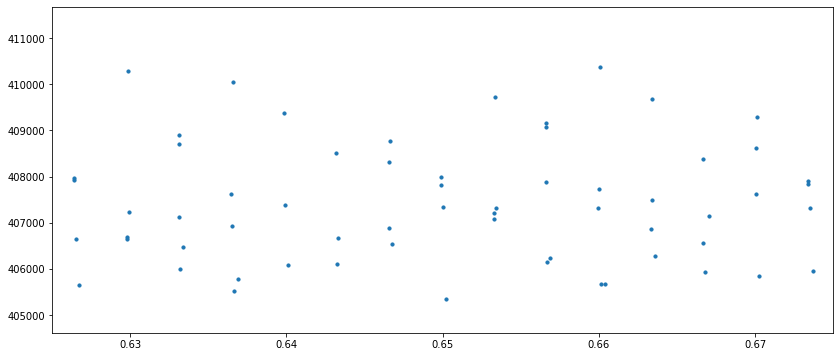

In [90]:
for key in data.keys():
    folded_bjds = (data[key]['bjds'] % period)/period

    fig = plt.figure(figsize=(14, 6))
    plt.scatter(folded_bjds, data[key]['pdcsap_fluxes'], s=10)
    plt.xlim(0.625, 0.675)
    plt.show()

In [91]:
#the optimizer
def likelihood(period, data, verbose_out=False):
   
    #fold the data based on the period
    folded_bjds = (data['bjds'] % period)/period
    
    #bin the data (try 0.01 period bins)
    bin_width = 0.005
    binned_pdcsap_fluxes = []
    binned_bjds = []
    
    i = 0
    while i < 1:
        indx = (folded_bjds >= i)*(folded_bjds < i+bin_width)
        binned_pdcsap_fluxes.append(data['pdcsap_fluxes'][indx])
        binned_bjds.append(folded_bjds[indx])
        i += bin_width
        
    #i hate this
    binned_pdcsap_fluxes = np.array(binned_pdcsap_fluxes)
    binned_bjds = np.array(binned_bjds)
    
    #compute the dispersion of each bin w.r.t. a linear fit:    
    #then adjust the data according to that linear fit
    slope_adj_fluxes = []
    lfs = []
    for i in range(len(binned_bjds)):
        indx = (np.logical_not(np.isnan(binned_bjds[i])))*(np.logical_not(np.isnan(binned_pdcsap_fluxes[i])))
        if len(binned_pdcsap_fluxes[i][indx]) == 0: #safeguard in case there isn't data in a bin
            lf = linregress([0, 1], [0, 0])
        else:
            lf = linregress(binned_bjds[i][indx], binned_pdcsap_fluxes[i][indx])
        lfs.append(lf)
        slope_adj_fluxes.append([binned_pdcsap_fluxes[i][indx][j] - (lf[0]*binned_bjds[i][indx][j] + lf[1]) for j in range(len(binned_pdcsap_fluxes[i][indx]))])
    
        #these are to plot the linear fits if we think there's a problem with those
        #fig = plt.figure(figsize=(6, 6))
        #plt.scatter(binned_bjds[i][indx], binned_pdcsap_fluxes[i][indx])
        #plt.plot([np.min(binned_bjds[i][indx]), np.max(binned_bjds[i][indx])], [lf[0]*np.min(binned_bjds[i][indx]) + lf[1], lf[0]*np.max(binned_bjds[i][indx]) + lf[1]], c='k', ls='--')
        #plt.show()
    
    disps = np.array([np.nanstd(f) for f in slope_adj_fluxes])
    for i in range(len(disps)):
        if len(binned_pdcsap_fluxes[i]) == 0:
            disps[i] = np.nan
    
    #likelihood score is just the sum of all dispersions
    penalty = 1000 #penalize not having anything in a bin
    like = np.nansum(disps**2)/len(disps[np.logical_not(np.isnan(disps))]) + len(disps[np.isnan(disps)])*penalty
    
    if verbose_out:
        return like, disps, lfs
    else:
        return like

def optimize_time_slices(data):
    
    best_periods = []
    
    for key in data.keys():
        result = minimize(likelihood, period, args=data[key], bounds=[[0, 2]])
        best_periods.append(result.x)
        
    return best_periods

def optimize_time_slices_de(data):
    
    #differential evolution controls
    pop_size = 10 #10 times number of parameters
    diff_scaling_factor = 0.8
    crossover_rate = 0.9
    max_it = int(1e10)
    
    best_periods = []
    
    for key in data.keys():
        result = differential_evolution(likelihood, 
                                        [(period*0.95, period*1.05)], #bounds
                                        args=(data[key],), 
                                        maxiter=max_it, 
                                        popsize=pop_size, 
                                        mutation=diff_scaling_factor, 
                                        recombination=crossover_rate, 
                                        workers=-1, 
                                        disp=False)
        best_periods.append(result.x)
        
    return best_periods

#brute force bc I think that the likliehood surface isn't actually differentiable
def scan_time_slices(data):
    
    scan_width = 0.0000005
    scan_n = 1e2
    times = np.arange(period-scan_n*scan_width, period+scan_n*scan_width, scan_width)
    
    best_periods = []
    all_like_list = []
    
    for key in data.keys():
        
        all_likes = []
    
        best_period = period
        best_like = likelihood(period, data[key])

        for p in times:
            like = likelihood(p, data[key])
            all_likes.append(like)
            if like < best_like:
                best_period = p
                best_like = like

        best_periods.append(best_period)
        all_like_list.append(all_likes)
        
    return best_periods, all_like_list, times

In [92]:
#optimize the period of each time slice
#best_periods = optimize_time_slices(data)
#best_periods = optimize_time_slices_de(data)
best_periods, all_like_list, times = scan_time_slices(data)
print('Optimized periods:', best_periods)

/tmp/ipykernel_5609/3272615009.py:20: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  binned_pdcsap_fluxes = np.array(binned_pdcsap_fluxes)
/tmp/ipykernel_5609/3272615009.py:21: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  binned_bjds = np.array(binned_bjds)
/home/donlon/.local/lib/python3.8/site-packages/scipy/stats/_stats_mstats_common.py:160: RuntimeWarning: invalid value encountered in double_scalars
  slope = ssxym / ssxm
/home/donlon/.local/lib/python3.8/site-packages/scipy/stats/_stats_mstats_common.py:174: RuntimeWarning: invalid value encounter

Optimized periods: [0.09985069564234939, 0.09978419564234932, 0.09978519564234932, 0.0998676956423494, 0.09980769564234934, 0.0998686956423494, 0.09981319564234935, 0.09980969564234934, 0.09980719564234934, 0.09981069564234935, 0.09981319564234935, 0.09981019564234934, 0.09980719564234934, 0.09981069564234935, 0.09981319564234935, 0.09981069564234935, 0.09980719564234934, 0.09981169564234935, 0.09979569564234933]


period: 0.09985032695440976
variance: 1.1346089283469381e-11


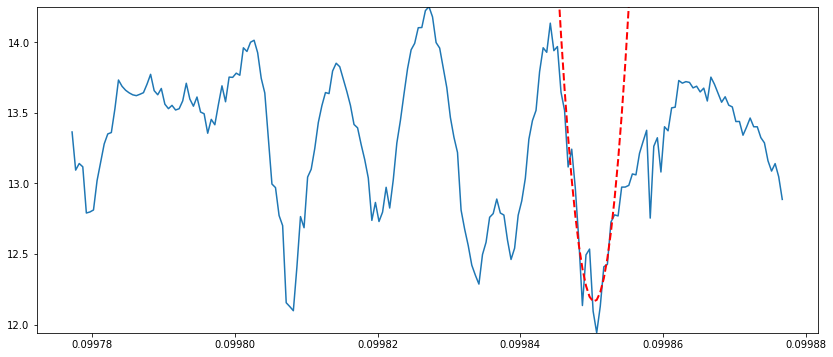

period: 0.09978420822718123
variance: 5.689189982892038e-12


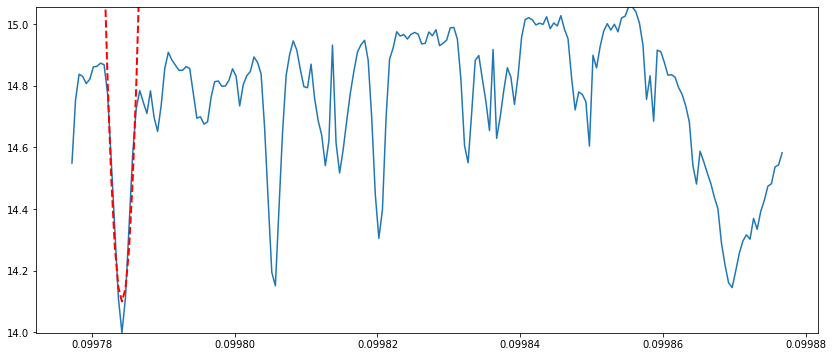

period: 0.09978504355242783
variance: 3.113108507463203e-10


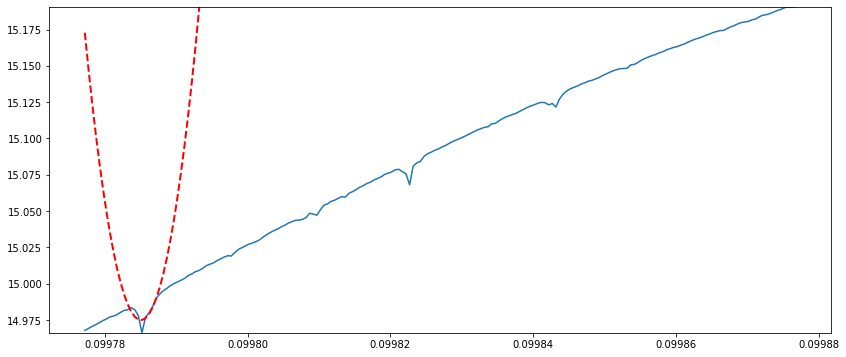

period: 0.09986749823032949
variance: 2.6452278216161125e-11


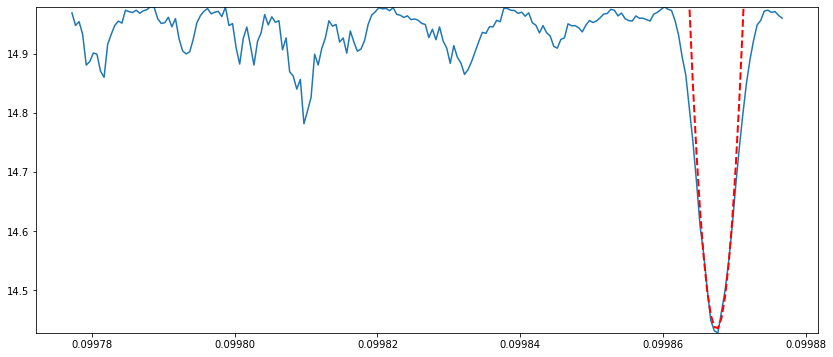

period: 0.09980680381512118
variance: 1.922362161232321e-11


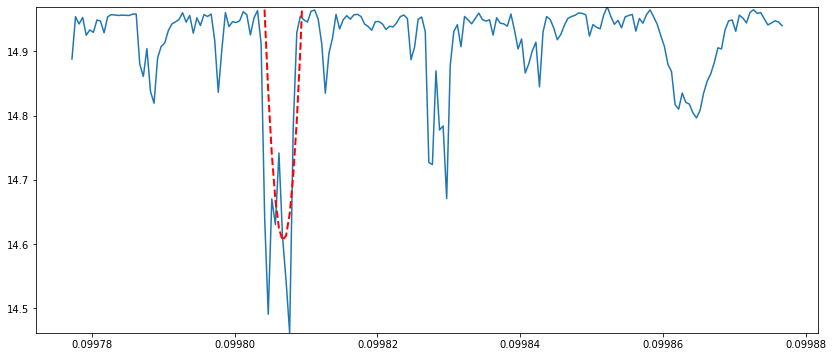

period: 0.09986841130472315
variance: 4.481930616203462e-11


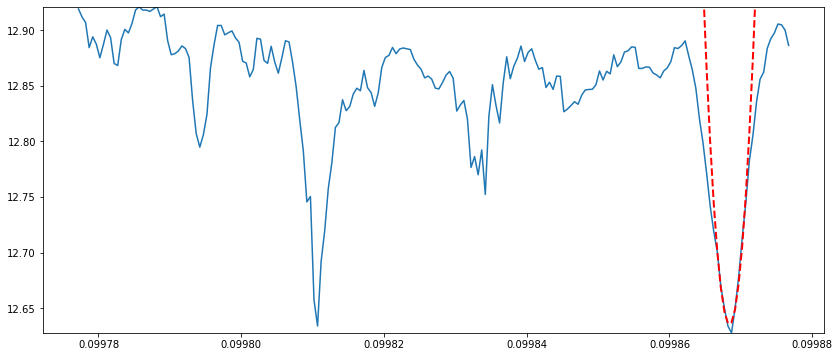

period: 0.0998155248165661
variance: 3.2962392664680916e-11


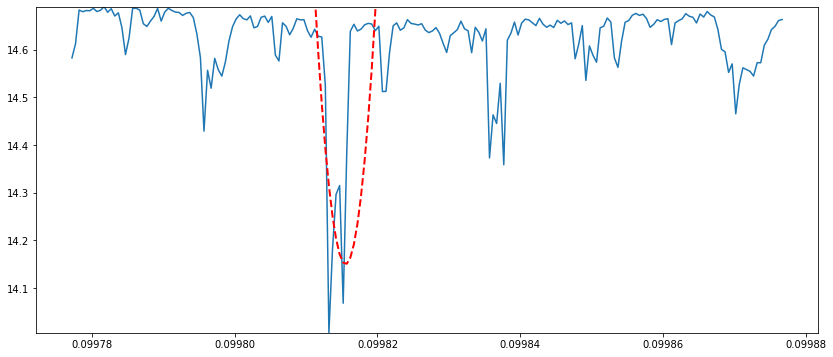

period: 0.09980977175037714
variance: 2.4436689814286867e-11


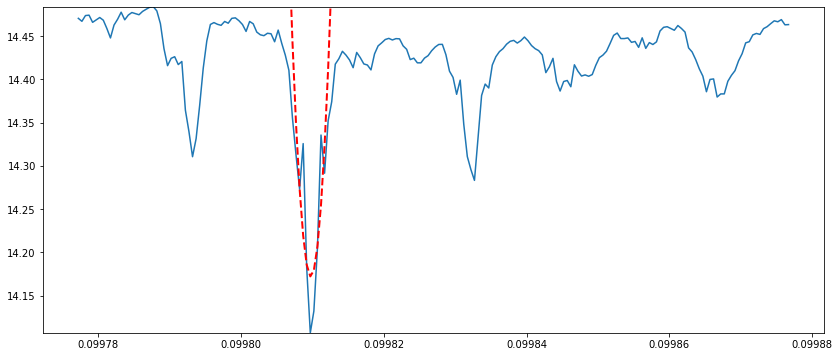

period: 0.09980616785346522
variance: 1.277206756954489e-11


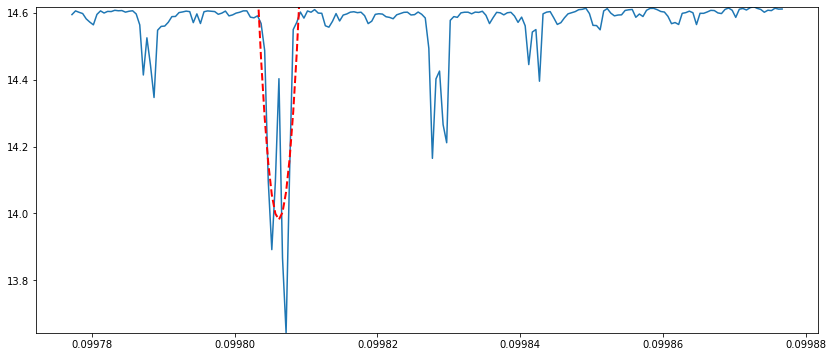

period: 0.09981074825011349
variance: 1.6847156338942033e-11


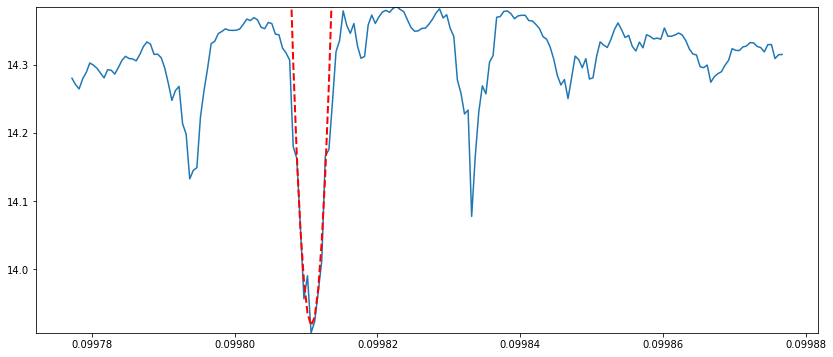

period: 0.09981601823761113
variance: 3.69807860928158e-11


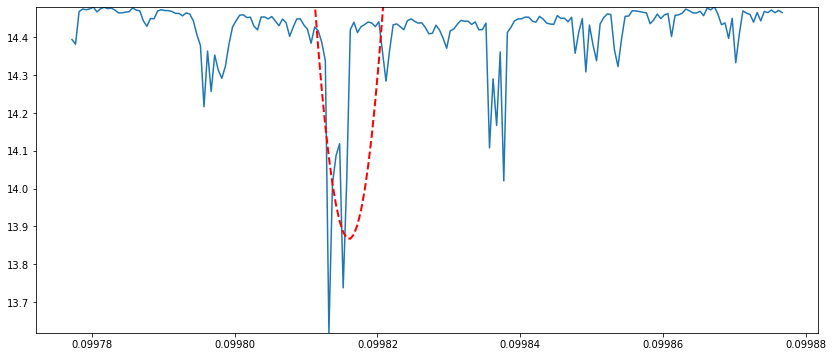

period: 0.0998100855989064
variance: 1.9988356310548002e-11


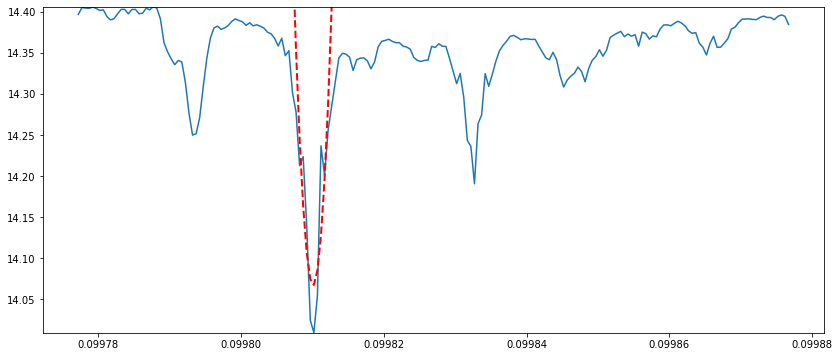

period: 0.09980575137129317
variance: 1.8435597435245983e-11


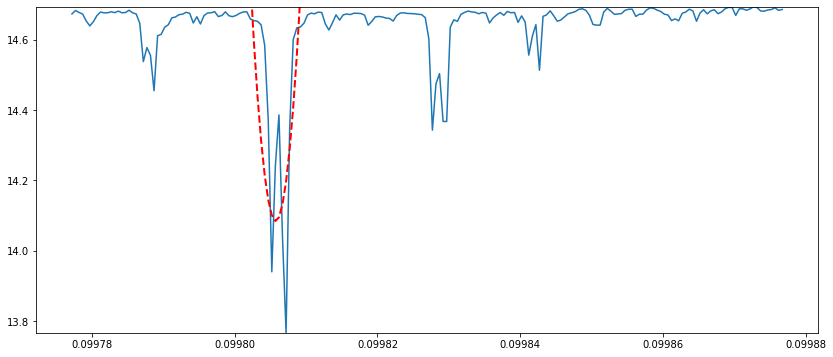

period: 0.09981075262354754
variance: 2.8133994556667012e-11


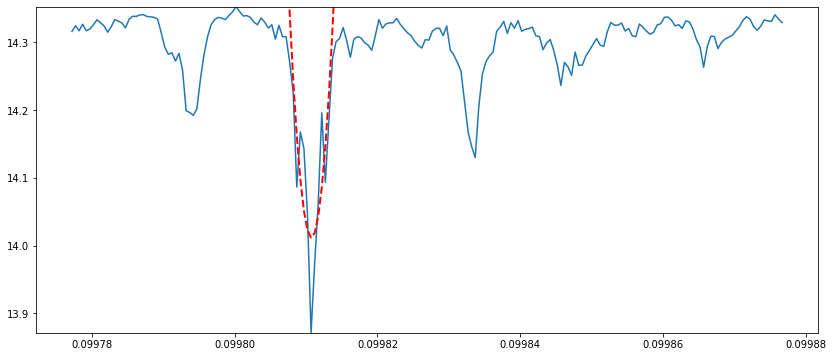

period: 0.09981557809323593
variance: 2.8887256955383445e-11


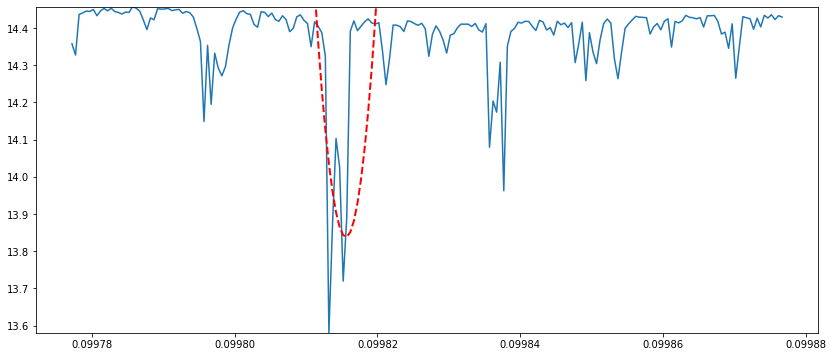

period: 0.09981026508205462
variance: 2.1825576279119557e-11


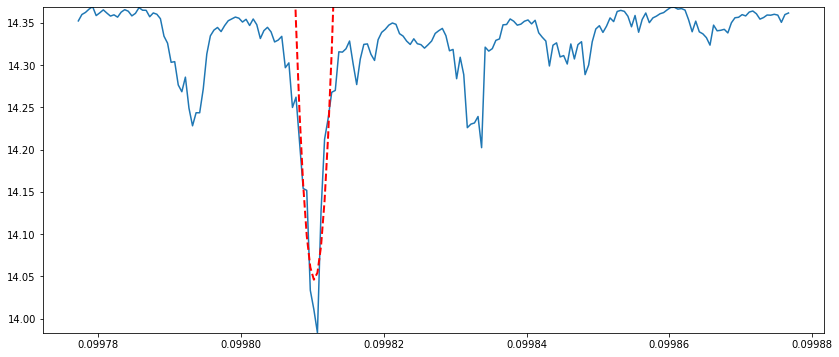

period: 0.09980304498926736
variance: 4.9453748899595816e-11


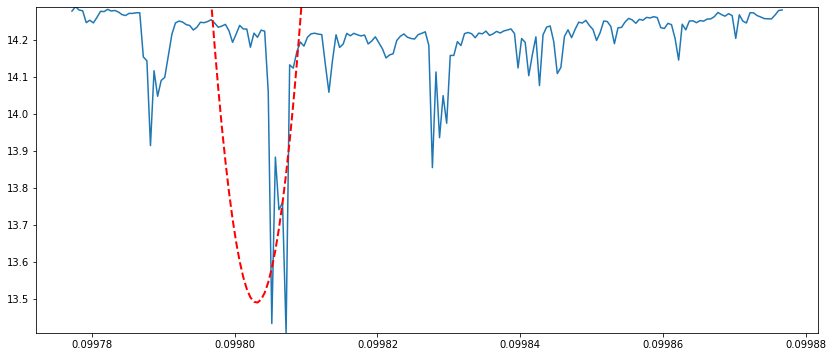

period: 0.09981152186732575
variance: 1.7889997428910878e-11


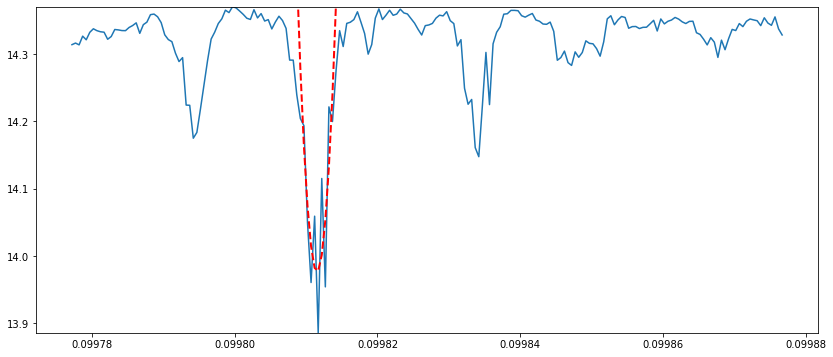

period: 0.09979589721147332
variance: 5.425121769674156e-12


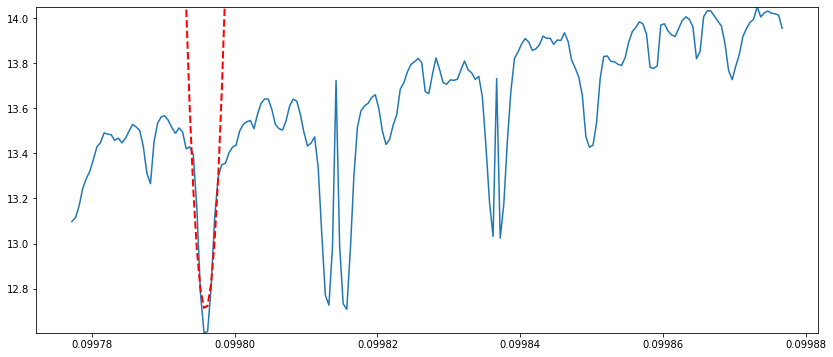

In [93]:
#plot likelihood surfaces
fit_periods = []
variances = []

for key in data.keys():
    fig = plt.figure(figsize=(14, 6))
    plt.plot(times, np.log(all_like_list[key]))

    min_indx = np.argmin(all_like_list[key])
    indx = (np.abs(times - times[min_indx]) < 0.0000025)
    log_like = np.log(np.array(all_like_list)[key][indx])
    pf = polyfit(np.array(times)[indx], log_like, 2)
    plt.plot(times, pf[0]*times**2 + pf[1]*times + pf[2], c='r', lw=2, ls='--')
    
    fit_period = -pf[1]/(2*pf[0])
    variance = 1/pf[0]
    
    fit_periods.append(fit_period)
    variances.append(variance)
    
    print('period:', fit_period)
    print('variance:', variance)
    
    plt.ylim(np.min(np.log(np.array(all_like_list)[key])), np.max(np.log(np.array(all_like_list)[key])))
    
    plt.show()

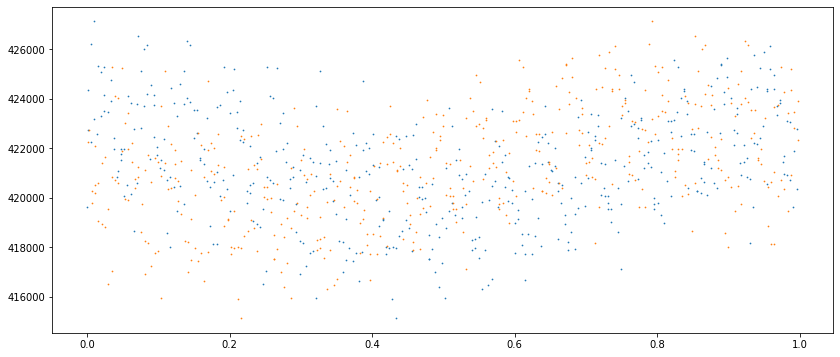

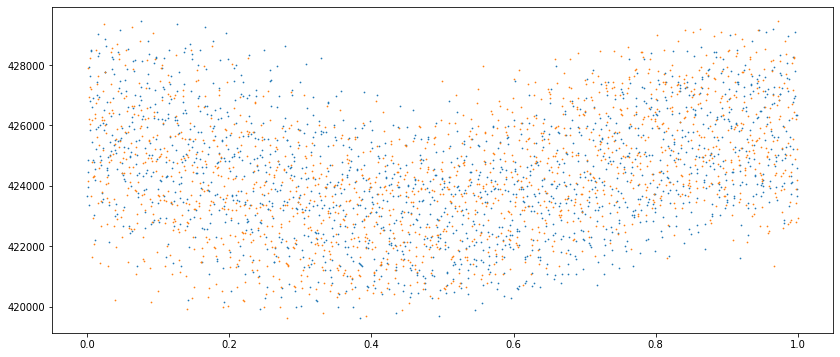

/tmp/ipykernel_5609/309669324.py:5: RuntimeWarning: invalid value encountered in remainder
  folded_bjds = (data[key]['bjds'] % best_periods[key])/best_periods[key]
/tmp/ipykernel_5609/309669324.py:8: RuntimeWarning: invalid value encountered in remainder
  folded_bjds = (data[key]['bjds'] % fit_periods[key])/fit_periods[key]


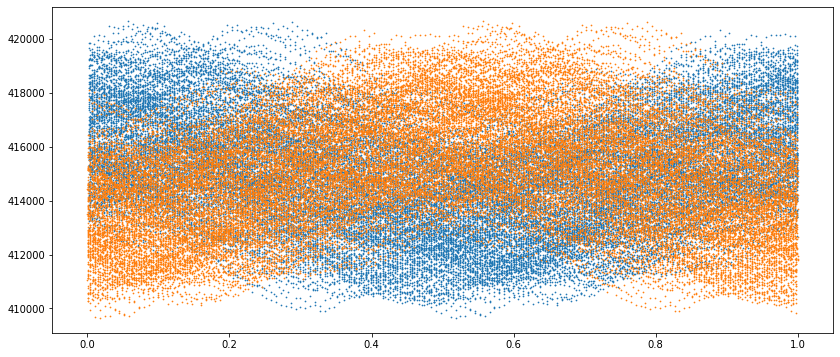

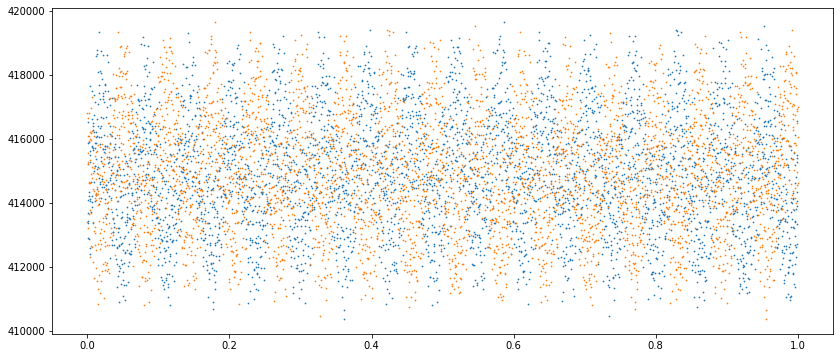

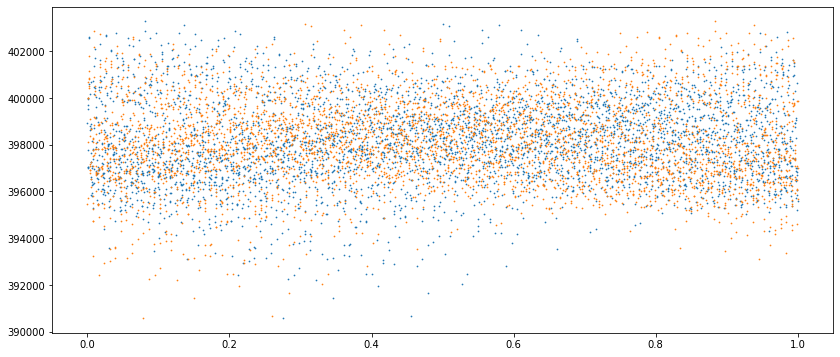

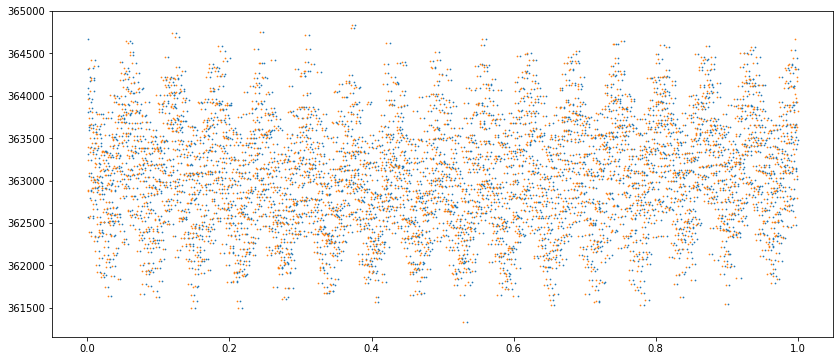

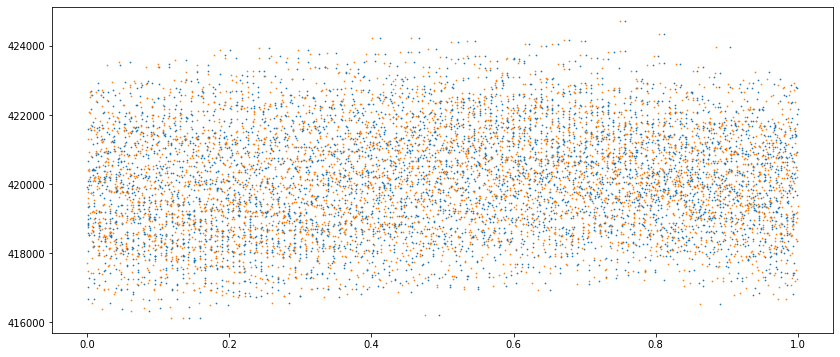

...

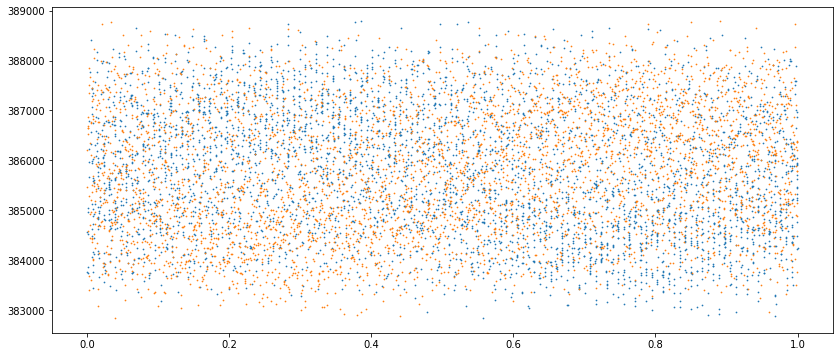

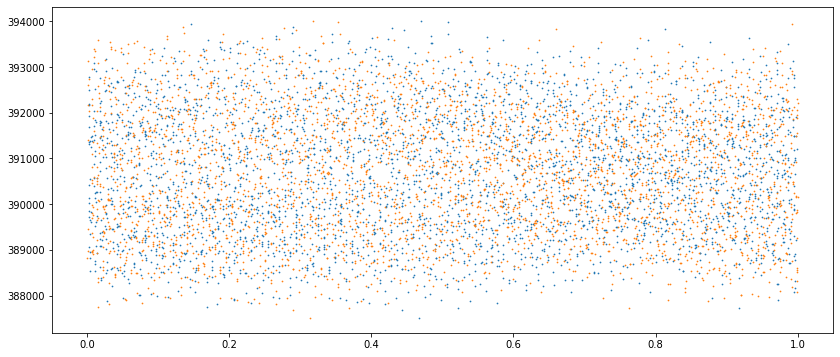

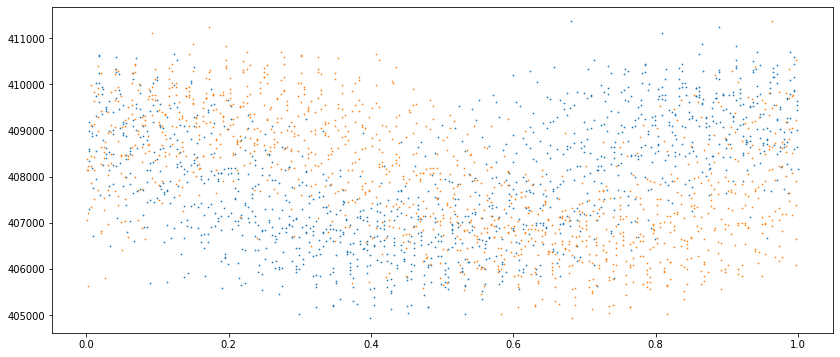

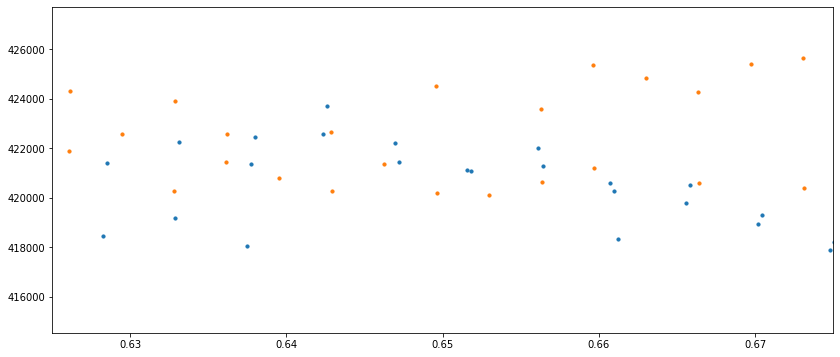

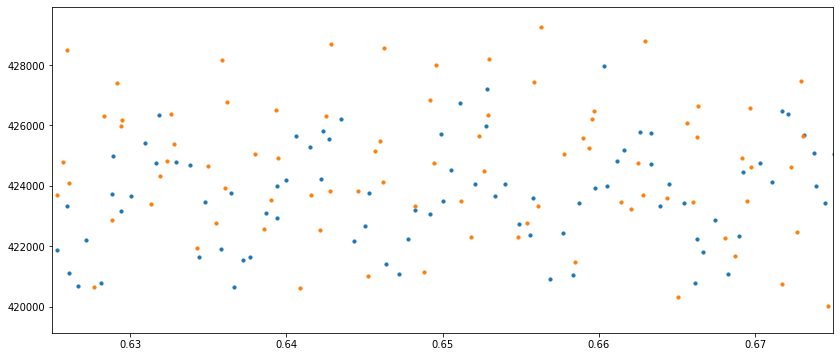

/tmp/ipykernel_5609/309669324.py:17: RuntimeWarning: invalid value encountered in remainder
  folded_bjds = (data[key]['bjds'] % best_periods[key])/best_periods[key]
/tmp/ipykernel_5609/309669324.py:20: RuntimeWarning: invalid value encountered in remainder
  folded_bjds = (data[key]['bjds'] % period)/period


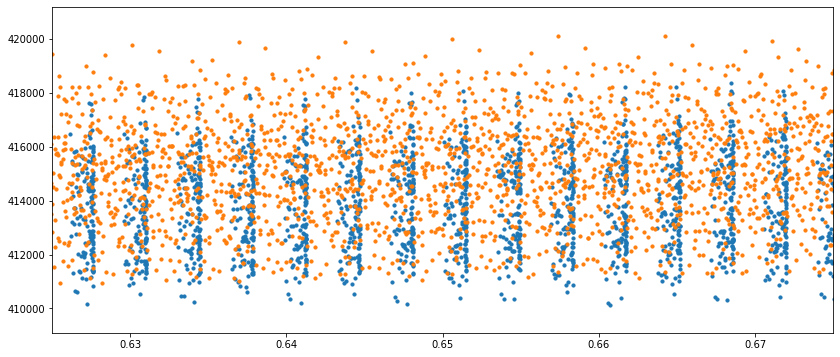

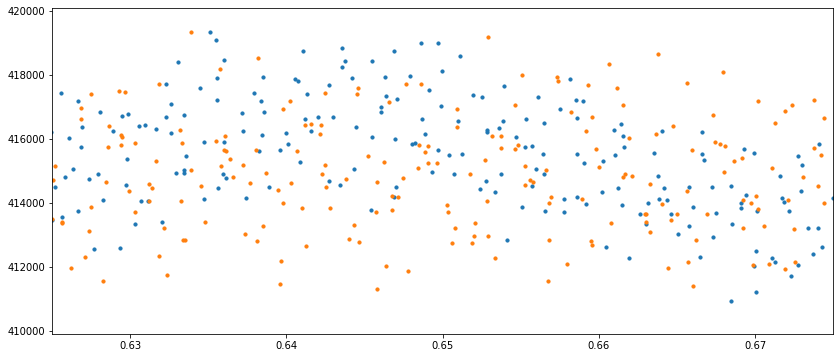

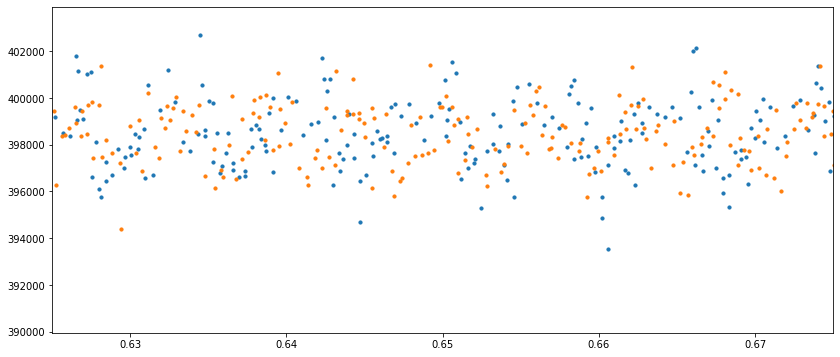

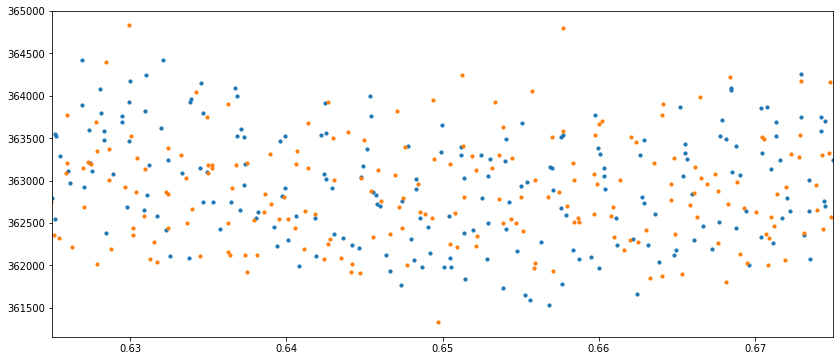

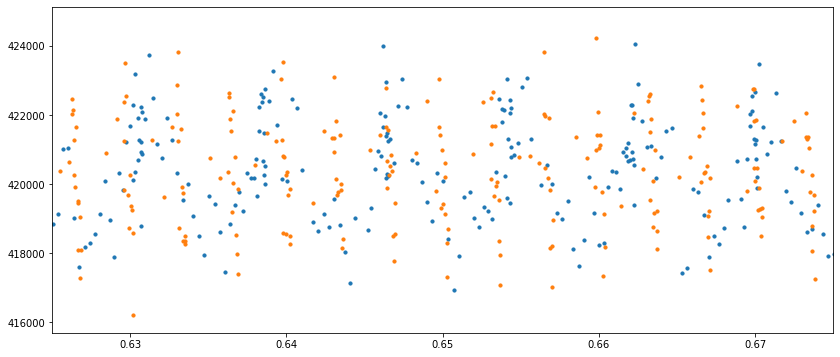

...

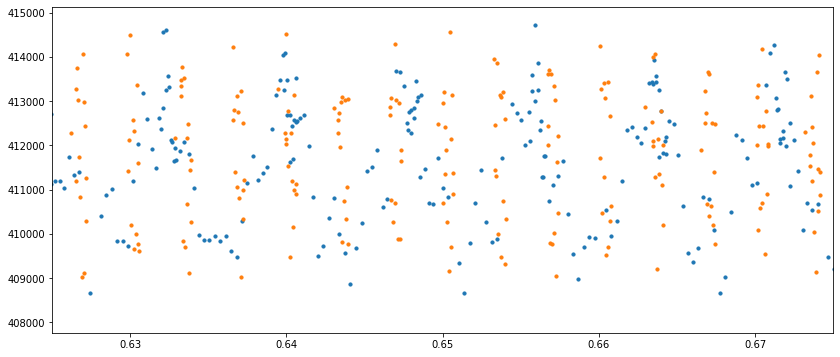

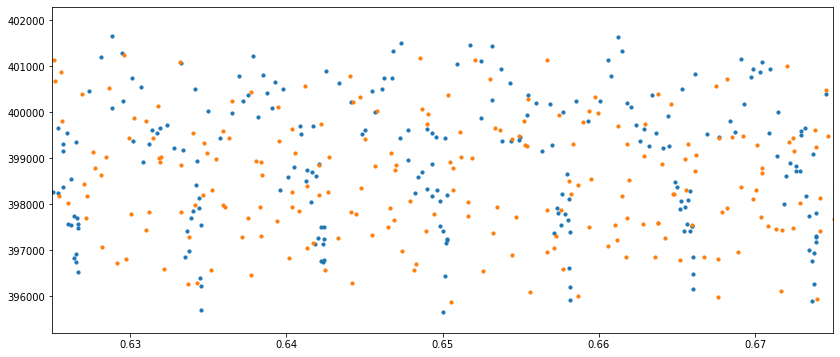

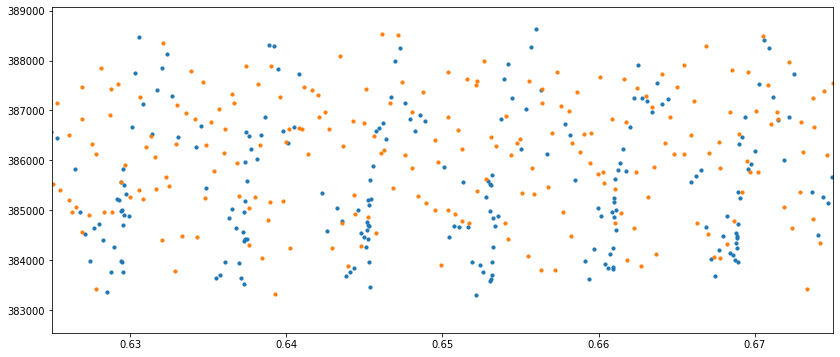

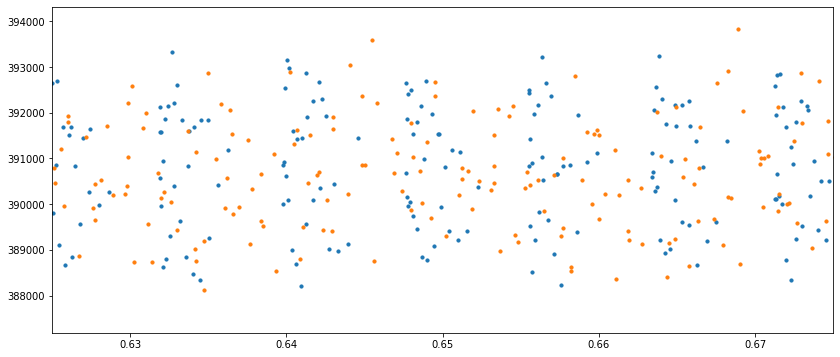

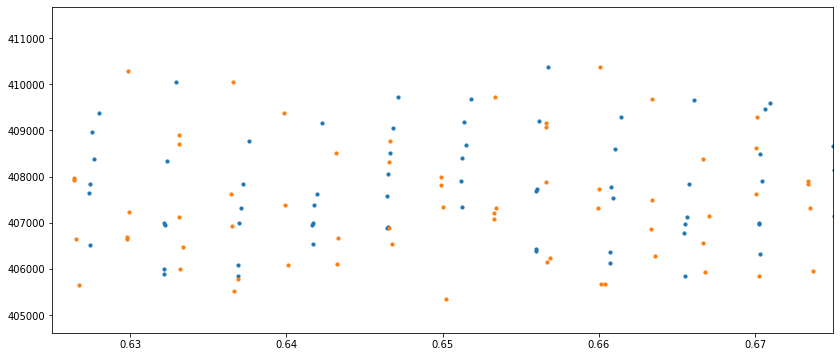

In [94]:
#print the optimized data 
for key in data.keys():
    fig = plt.figure(figsize=(14, 6))
    
    folded_bjds = (data[key]['bjds'] % best_periods[key])/best_periods[key]
    plt.scatter(folded_bjds, data[key]['pdcsap_fluxes'], s=0.5)
    
    folded_bjds = (data[key]['bjds'] % fit_periods[key])/fit_periods[key]
    plt.scatter(folded_bjds, data[key]['pdcsap_fluxes'], s=0.5)
    
    plt.show()
    
for key in data.keys():
    
    fig = plt.figure(figsize=(14, 6))
    
    folded_bjds = (data[key]['bjds'] % best_periods[key])/best_periods[key]
    plt.scatter(folded_bjds, data[key]['pdcsap_fluxes'], s=10)
    
    folded_bjds = (data[key]['bjds'] % period)/period
    plt.scatter(folded_bjds, data[key]['pdcsap_fluxes'], s=10)
    
    plt.xlim(0.625, 0.675)
    plt.show()

dp/dt: -1.0485849087360776e-08
std dev: 1.130128473419806e-08


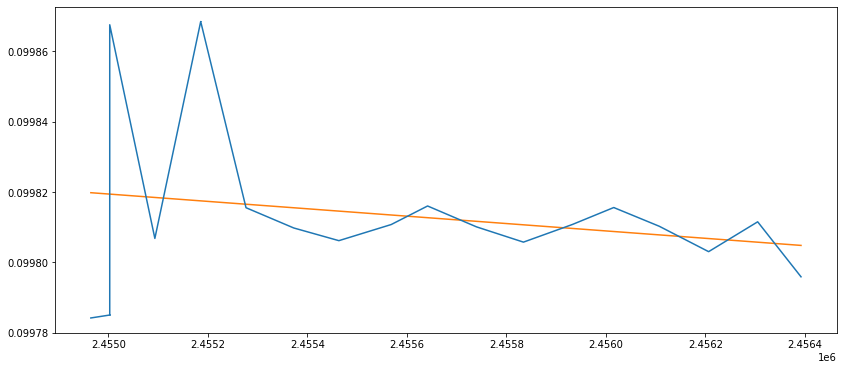

dp/dt: 4.862404249039594e-09
uncertainty: 5.554437618135575e-09


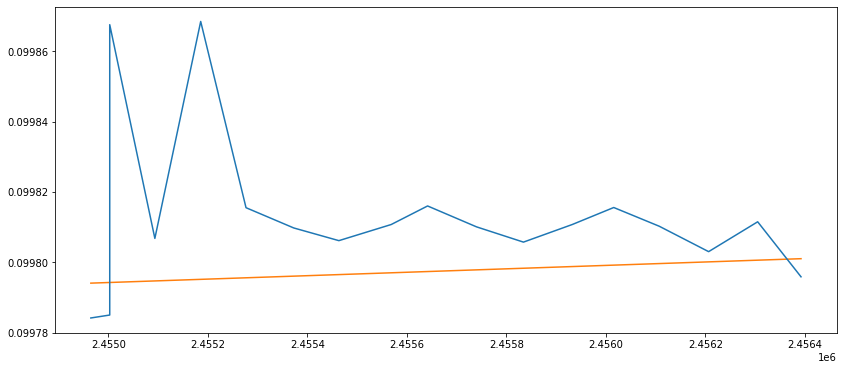

In [95]:
#plot period as a function of time

fig = plt.figure(figsize=(14, 6))
x = [data[key]['bjds'][0] for key in data.keys()][1:]
plt.errorbar(x, fit_periods[1:], yerr=np.array(variances[1:])*500)

lf = linregress(x, fit_periods[1:])
plt.plot([np.min(x), np.max(x)], [lf[0]*np.min(x) + lf[1], lf[0]*np.max(x) + lf[1]])
print('dp/dt:', lf.slope)
print('std dev:', lf.stderr)
print('==========================')
plt.show()

def func(x, m, b):
    return m*x + b

cf = curve_fit(func, x, fit_periods[1:], sigma=variances[1:])
perr = np.sqrt(np.diag(cf[1]))
print('dp/dt:', cf[0][0])
print('uncertainty:', perr[0])

fig = plt.figure(figsize=(14, 6))
plt.errorbar(x, fit_periods[1:], yerr=variances[1:])
plt.plot([np.min(x), np.max(x)], [cf[0][0]*np.min(x) + cf[0][1], cf[0][0]*np.max(x) + cf[0][1]])
plt.show()

In [96]:
#fit a line to it (dp/dt)

#compute dispersion of those points/quality of linear fit